In [1]:
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, random_split, Dataset, DataLoader, ConcatDataset
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.model_selection import train_test_split
import cv2
import random
import sys
from PIL import Image
import os
from torch.optim.lr_scheduler import ReduceLROnPlateau
import torch.nn as nn
import torch.nn.functional as F

# Applying Filters to enhance image


In [7]:
class ApplyCLAHE(object):
    """Applies Contrast Limited Adaptive Histogram Equalization (CLAHE) to the image.
    This is better than standard histogram equalization for natural images."""
    def __call__(self, img):
        # Convert PIL image to OpenCV format (numpy array)
        img_np = np.array(img)
        
        # Check if image is grayscale or color
        if len(img_np.shape) == 2:  # Grayscale
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
            img_eq = clahe.apply(img_np)
        else: # Color (apply to L channel of LAB)
            lab = cv2.cvtColor(img_np, cv2.COLOR_RGB2LAB)
            l, a, b = cv2.split(lab)
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
            l_eq = clahe.apply(l)
            lab_eq = cv2.merge((l_eq, a, b))
            img_eq = cv2.cvtColor(lab_eq, cv2.COLOR_LAB2RGB)
            
        # Convert back to PIL image
        return Image.fromarray(img_eq)


In [9]:
data_folder = './Training'  # or './Testing'

for class_name in os.listdir(data_folder):
    class_path = os.path.join(data_folder, class_name)
    if os.path.isdir(class_path):
        num_images = len([f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
        print(f"Class '{class_name}': {num_images} images")

Class 'glioma': 1321 images
Class 'meningioma': 1339 images
Class 'notumor': 1595 images
Class 'pituitary': 1457 images


# Balancing the Data

In [13]:

augment = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.05)
])

input_folder = './Training'
output_folder = './Augmented_Training'
os.makedirs(output_folder, exist_ok=True)

# -----------------------
# Count images per class
# -----------------------
class_counts = {}
for class_name in os.listdir(input_folder):
    class_path = os.path.join(input_folder, class_name)
    if os.path.isdir(class_path):
        images = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        class_counts[class_name] = len(images)

# Target number of images (match the largest class)
target_count = max(class_counts.values())

# -----------------------
# Process each class
# -----------------------
for class_name in os.listdir(input_folder):
    class_path = os.path.join(input_folder, class_name)
    save_class_path = os.path.join(output_folder, class_name)
    os.makedirs(save_class_path, exist_ok=True)

    images = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Copy original images and convert to RGB
    for img_name in images:
        img = Image.open(os.path.join(class_path, img_name)).convert('RGB')
        img.save(os.path.join(save_class_path, img_name))

    # Number of extra images needed to match target
    extra_needed = target_count - len(images)

    # Generate augmented images
    for i in range(extra_needed):
        img_name = random.choice(images)  # randomly pick an original image
        img = Image.open(os.path.join(class_path, img_name)).convert('RGB')
        augmented_img = augment(img)
        new_name = img_name.split('.')[0] + f'_aug{i}.png'
        augmented_img.save(os.path.join(save_class_path, new_name))

print("Balanced augmentation complete!")
data_folder = './Augmented_Training'  # or './Testing'

for class_name in os.listdir(data_folder):
    class_path = os.path.join(data_folder, class_name)
    if os.path.isdir(class_path):
        num_images = len([f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
        print(f"Class '{class_name}': {num_images} images")

Balanced augmentation complete!


# Transform and retrieving and loading images to dataloaders

In [11]:
data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    ApplyCLAHE(),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.1845, 0.1845, 0.1846], std=[0.1992, 0.1992, 0.1992])
])


train_dataset = ImageFolder('./Augmented_Training', transform=data_transforms)
train_size = int(0.9 * len(train_dataset))  
val_size = len(train_dataset) - train_size  
train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])
test_dataset = ImageFolder('./Testing', transform=data_transforms)

In [13]:

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

torch.Size([32, 3, 224, 224])


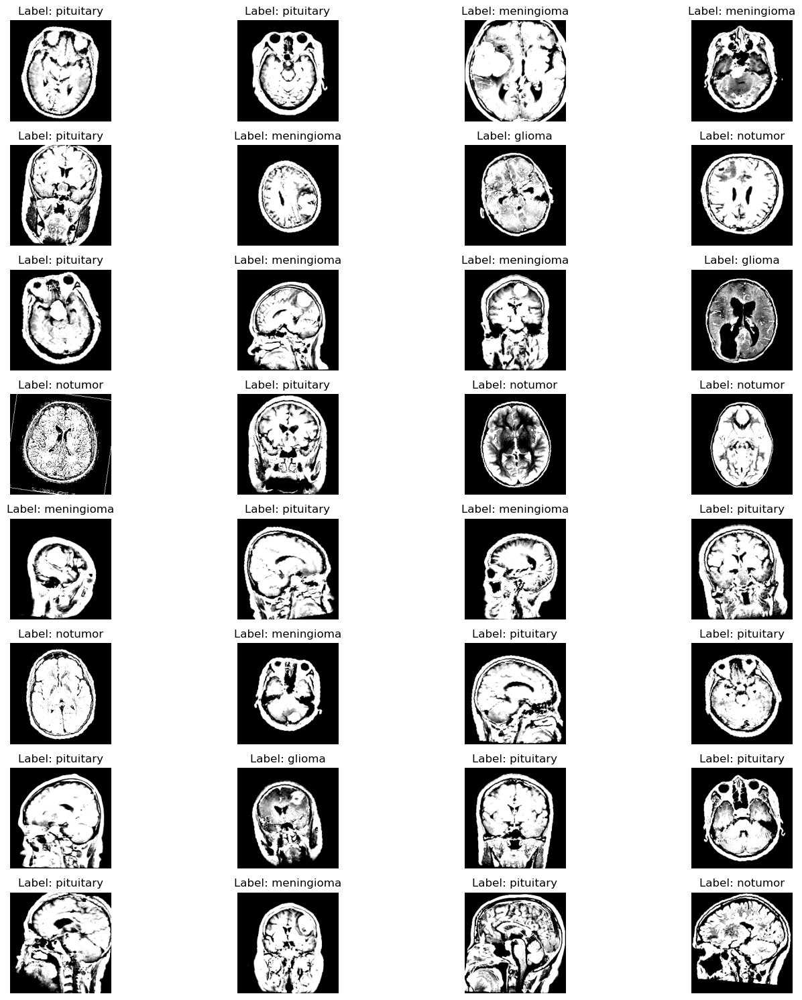

In [15]:
data_iter = iter(train_loader)
images, labels = next(data_iter)


full_train_dataset = ImageFolder('./Augmented_Training', transform=data_transforms)
# Convert images to numpy arrays and denormalize
mean = np.array([0.1845, 0.1845, 0.1846])
std = np.array([0.1992, 0.1992, 0.1992])
print(images.shape)
#images = (images.numpy().transpose((0, 2, 3, 1)) * std + mean).clip(0, 1)
images = (images.numpy().transpose((0, 2, 3, 1))).clip(0, 1) ## uncomment this if you want to see the images with normalization
# Create a grid of images
num_images = len(images)
rows = int(np.ceil(num_images / 4))
fig, axes = plt.subplots(rows, 4, figsize=(15, 15))

# Plot images with labels
for i, ax in enumerate(axes.flat):
    if i < num_images:
        ax.imshow(images[i])
        ax.set_title(f'Label: {full_train_dataset.classes[labels[i]]}')
    ax.axis('off')

plt.tight_layout()
plt.show()


# Model architicture 

In [17]:

class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        
        self.cnn_model = nn.Sequential(
            # Block 1
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),        # Added BatchNorm
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            # Block 2
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),        # Added BatchNorm
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            # Block 3
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),       # Added BatchNorm
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            # Block 4
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),       # Added BatchNorm
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        
        # GLOBAL AVERAGE POOLING replaces the massive Linear layer
        self.gap = nn.AdaptiveAvgPool2d(1) 
        
        self.fc_model = nn.Sequential(
            nn.Flatten(),
            nn.Linear(256, 512),  # Input is now just 256 (channels)!
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(512, 128),
            nn.ReLU(inplace=True),
            nn.Linear(128, 4)
        )

    def forward(self, x):
        x = self.cnn_model(x)
        x = self.gap(x)       # Reduces (Batch, 256, 14, 14) -> (Batch, 256, 1, 1)
        x = self.fc_model(x)
        return x

# Training Parameters

In [26]:

device = torch.device("cuda:0")
model = CNN().to(device)
eta = 0.001
loss_F = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr = eta)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)
epoch_train_loss= []
epoch_val_loss =[]
train_accs =[]
val_accs = []

D:\software\Anaconda\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [27]:
number_epochs = 50
highest_val_accuracy = 0.0
for epoch in range(number_epochs):
    model.train()
    train_loss = 0.0
    correct = 0
    total = 0
    for batch_idx, (images, labels) in enumerate(train_loader):
        images = images.to(device)
        labels = labels.to(device)
        optimizer.zero_grad() ## to delete any cache
        outputs = model(images)
        ## now we have 32 values in the prediction and 32 values in the label, we need to merge them together
        loss = loss_F(outputs, labels)
        loss.backward() ## this computes back propagation to update the gradients
        ##the next step is to update the parameters of the model according to those gradients 
        optimizer.step()
        train_loss += loss.item()## now loss is a tensor, we need to store the value of the tensor in the losses list, .item() grabs the value of tensors
        predicted = torch.max(outputs, 1)[1]##tensor([
                                                       ##[2.3, 1.5, 0.2, 3.1],   # Scores for Sample 1
                                                       ##[0.5, 2.2, 3.3, 0.8],   # Scores for Sample 2
                                                       ##[1.1, 0.9, 2.5, 4.0]    # Scores for Sample 3])
        total = total + labels.size(0)
        correct += (predicted == labels).sum().item()
    train_accuracy = correct/total
    train_loss /=len(train_loader)
    epoch_train_loss.append(train_loss)
    train_accs.append(train_accuracy)
    
    ##validate for current epoch
    
    model.eval()
    val_loss = 0.0
    correct = 0
    total= 0
    true_labels = []
    predicted_labels = []
    with torch.no_grad(): ## just to save computational power, no need for calculating gradients
        for D, (images, labels) in enumerate(val_loader):
            images = images.to(device)
            labels = labels.to(device)
            output = model(images) 
            loss = loss_F(output, labels)
            val_loss += loss.item()
            predicted = torch.max(output, 1)[1]
            true_labels.extend(labels.cpu().numpy())
            predicted_labels.extend(predicted.cpu().numpy())
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    val_loss = val_loss / len(val_loader)
    epoch_val_loss.append(val_loss)
    val_accuracy = correct / total
    val_accs.append(val_accuracy)
    true_labels = np.array(true_labels)
    predicted_labels = np.array(predicted_labels)
    
    print(f'Epoch [{epoch+1}/{number_epochs}], '
          f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accs[-1]:.2%}, '
          f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accs[-1]:.2%}')
    scheduler.step(val_loss)
    if val_accuracy > highest_val_accuracy:
        highest_val_accuracy = val_accuracy  # Update the highest validation accuracy
        torch.save(model.state_dict(), 'image_model.pth')

    accuracy = correct / total
    print(f'Validation Accuracy: {accuracy:.2%}')

Epoch [1/50], Training Loss: 0.7559, Training Accuracy: 69.63%, Validation Loss: 2.9674, Validation Accuracy: 47.34%
Validation Accuracy: 47.34%
Epoch [2/50], Training Loss: 0.5500, Training Accuracy: 78.77%, Validation Loss: 0.6320, Validation Accuracy: 78.06%
Validation Accuracy: 78.06%
Epoch [3/50], Training Loss: 0.5025, Training Accuracy: 81.30%, Validation Loss: 1.7831, Validation Accuracy: 52.04%
Validation Accuracy: 52.04%
Epoch [4/50], Training Loss: 0.4503, Training Accuracy: 83.37%, Validation Loss: 1.0920, Validation Accuracy: 69.28%
Validation Accuracy: 69.28%
Epoch [5/50], Training Loss: 0.4139, Training Accuracy: 84.78%, Validation Loss: 0.4280, Validation Accuracy: 84.17%
Validation Accuracy: 84.17%
Epoch [6/50], Training Loss: 0.3903, Training Accuracy: 85.89%, Validation Loss: 0.6239, Validation Accuracy: 80.88%
Validation Accuracy: 80.88%
Epoch [7/50], Training Loss: 0.3789, Training Accuracy: 85.93%, Validation Loss: 0.4043, Validation Accuracy: 84.64%
Validation Ac

## Training Results

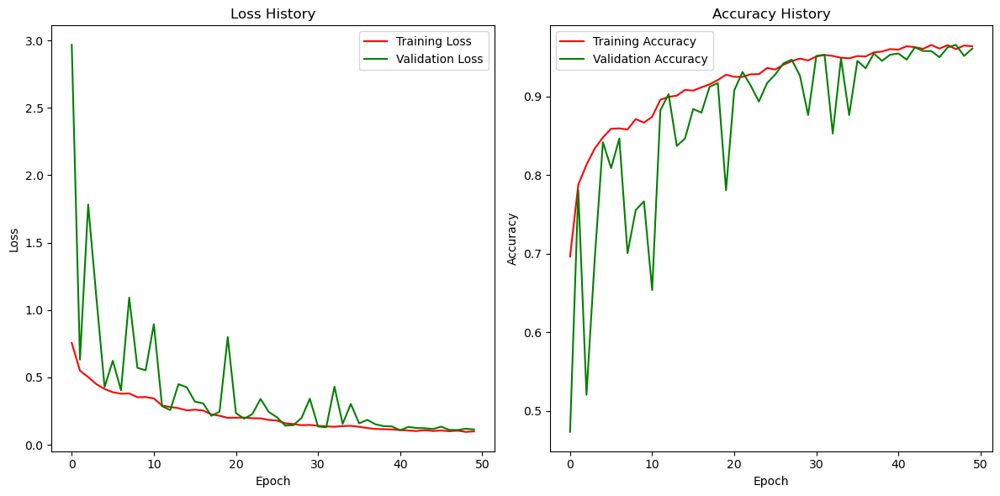

In [29]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(epoch_train_loss, c='r' ,label='Training Loss')
plt.plot(epoch_val_loss, c='g', label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss History')

plt.subplot(1, 2, 2)
plt.plot(train_accs, c='r', label='Training Accuracy')
plt.plot(val_accs, c='g', label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy History')

plt.tight_layout()
plt.show()
        

As we can see the model converges successfully

### Confusion matrix for validation to compare with testing

Classification Report:
              precision    recall  f1-score   support

      Glioma       0.97      0.97      0.97       165
  Meningioma       0.95      0.90      0.92       158
    No Tumor       0.96      0.98      0.97       162
   Pituitary       0.97      0.99      0.98       153

    accuracy                           0.96       638
   macro avg       0.96      0.96      0.96       638
weighted avg       0.96      0.96      0.96       638



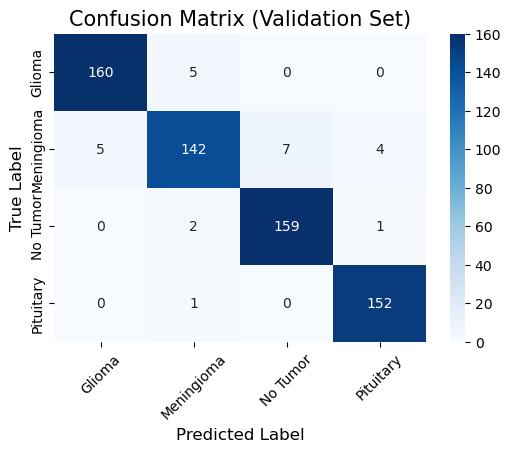

In [55]:
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Get the class names
# We use data_clean.classes because 'val_dataset' is a Subset and might not have the .classes attribute directly accessible
class_names = ['Glioma', 'Meningioma', 'No Tumor', 'Pituitary']

# 2. Print the Classification Report
# This gives you Precision, Recall, and F1-Score for each specific class
print("Classification Report:")
print(classification_report(true_labels, predicted_labels, target_names=class_names))

# 3. Compute the Confusion Matrix
cm = confusion_matrix(true_labels, predicted_labels)

# 4. Plot the Heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, 
            yticklabels=class_names)

plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.title('Confusion Matrix (Validation Set)', fontsize=15)
plt.xticks(rotation=45)
plt.show()

## Trying to visualaise what does the model see in the Conv layers (Feature maps)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


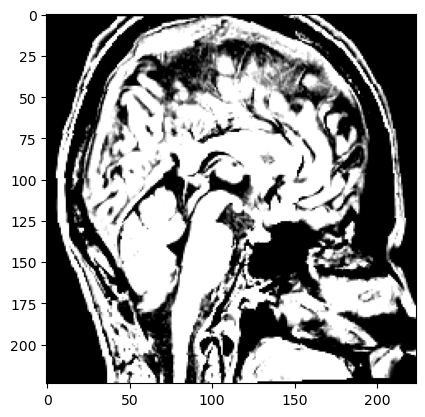

In [31]:
# Get the convolutional layers from the model
no_layers = 0
conv_layers = []
model_children = list(model.children())
for c in model_children:
    if isinstance(c, nn.Sequential):
        for layer in c.children():
            if isinstance(layer, nn.Conv2d):
                no_layers += 1
                conv_layers.append(layer)

# Get an image from the training dataset

img, _ = train_dataset[533]  
before = img.permute(1,2,0)
plt.imshow(before)
img, _ = train_dataset[533]

Layer  1


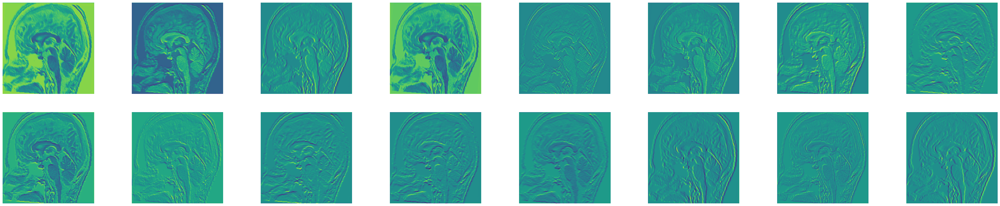

Layer  2


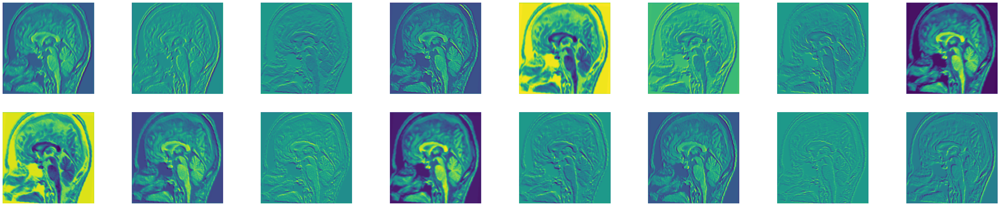

Layer  3


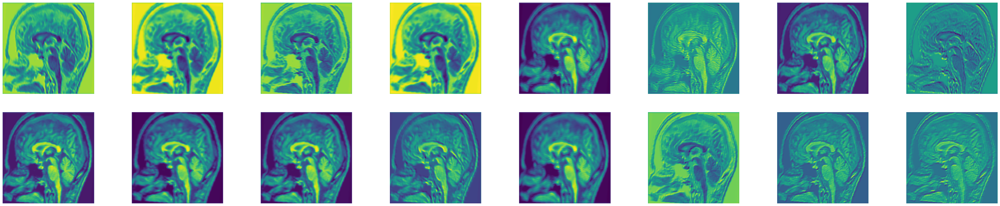

Layer  4


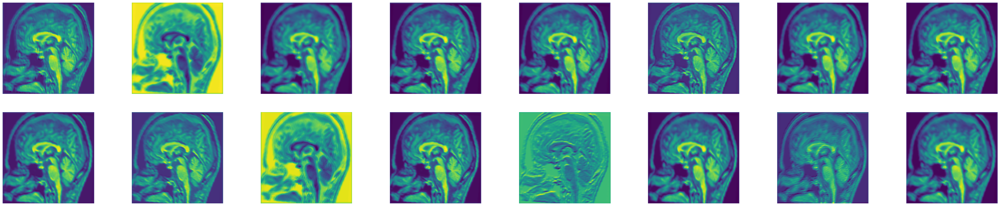

In [33]:
img = img.unsqueeze(0).to(device)  # Add batch dimension and move to device

# Pass the image through the convolutional layers to get feature maps
results = [conv_layers[0](img.float())]
for i in range(1, no_layers):
    results.append(conv_layers[i](results[-1]))

# Visualize the feature maps
for n in range(len(results)):
    plt.figure(figsize=(50, 10))
    layer_viz = results[n].squeeze()  # Remove batch dimension
    print("Layer ", n + 1)
    for i, f in enumerate(layer_viz):
        if i >= 16:  # Limit to the first 16 feature maps for visualization
            break
        plt.subplot(2, 8, i + 1)
        plt.imshow(f.detach().cpu().numpy(),cmap='viridis')  # Use a colormap for better visualization
        plt.axis("off")
    plt.show()
    plt.close()

## Creating a gui to test random Images from the internet

In [19]:
from PIL import Image

def predict_image_label(image_path, model, device='cuda:0'):
    # Set the model to evaluation mode
    model.eval()

    data_transforms = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.1845, 0.1845, 0.1846], std=[0.1992, 0.1992, 0.1992])
    ])

    # Load and preprocess the image
    image = Image.open(image_path).convert('RGB')  # Open the image and convert to RGB
    image = data_transforms(image)  # Apply transformations
    image = image.unsqueeze(0).to(device)  # Add batch dimension and move to device

    # Make the prediction
    with torch.no_grad():  # No need to calculate gradients
        output = model(image)
        _, predicted = torch.max(output, 1)  # Get the index of the max log-probability

    return predicted.item()  # Return the predicted label

In [21]:
custom_model = CNN()  
custom_model.load_state_dict(torch.load('image_model.pth'))  # Load your trained model weights
custom_model.to('cuda:0')  # Move to device


C:\Users\20112\AppData\Local\Temp\ipykernel_25776\3361215776.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  custom_model.load_state_dict(torch.load('image_model.pth')) 

CNN(
  (cnn_model): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=

### The GUI code

In [ ]:
import tkinter as tk
from tkinter import filedialog
from PIL import Image, ImageTk
import os

def get_prediction(image_path):
    predicted_label_custom = predict_image_label(image_path, custom_model)
    
    mapping = {0: 'Glioma', 1: 'Meningioma', 2: 'No tumor', 3: 'Pituitary'}
    return mapping.get(predicted_label_custom, "Unknown")


def upload_image():
    # 1. Open File Explorer
    file_path = filedialog.askopenfilename(
        filetypes=[("Image files", "*.jpg *.jpeg *.png *.bmp")]
    )
    
    if file_path:
        # 2. Display the image in the GUI
        img = Image.open(file_path)
        img = img.resize((300, 300)) # Resize to fit the window
        img_tk = ImageTk.PhotoImage(img)
        
        image_label.config(image=img_tk)
        image_label.image = img_tk # Keep a reference
        
        # 3. Run Prediction
        result = get_prediction(file_path)
        
        # 4. Update Result Label
        result_label.config(text=f"Prediction: {result}", fg="#2ecc71" if result != "No tumor" else "#e74c3c")
        path_label.config(text=f"File: {os.path.basename(file_path)}")

# Initialize Window
root = tk.Tk()
root.title("Brain Tumor Classification AI")
root.geometry("500x600")
root.configure(bg="#f0f0f0")


title_label = tk.Label(root, text="Tumor Detection System", font=("Arial", 20, "bold"), bg="#f0f0f0")
title_label.pack(pady=20)

# Button to Upload
upload_btn = tk.Button(root, text="Select MRI Image", command=upload_image, 
                       font=("Arial", 12), bg="#3498db", fg="white", padx=20, pady=10)
upload_btn.pack(pady=10)


image_label = tk.Label(root, bg="#f0f0f0")
image_label.pack(pady=10)
path_label = tk.Label(root, text="No image selected", font=("Arial", 10), bg="#f0f0f0", fg="gray")
path_label.pack()
result_label = tk.Label(root, text="", font=("Arial", 16, "bold"), bg="#f0f0f0")
result_label.pack(pady=20)

root.mainloop()

## Evaluating accuracy on the testing dataset

In [39]:
device = torch.device("cuda:0")
model = CNN().to(device)
model.load_state_dict(torch.load('image_model.pth'))
model.eval() 

all_predictions = []
all_labels = []

with torch.no_grad():  
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1) 
        all_predictions.extend(predicted.cpu().numpy()) 
        all_labels.extend(labels.numpy())  

C:\Users\20112\AppData\Local\Temp\ipykernel_10920\128069099.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('image_model.pth'))


### Results 

In [44]:
all_predictions = np.array(all_predictions)
all_labels = np.array(all_labels)

# Step 4: Calculate accuracy
test_accuracy = accuracy_score(all_labels, all_predictions)
print(f'Test Accuracy: {test_accuracy:.2%}')

Test Accuracy: 93.82%


Confusion Matrix:
[[265  33   0   2]
 [  5 266  24  11]
 [  1   5 399   0]
 [  0   0   0 300]]
Classification Report:
              precision    recall  f1-score   support

      glioma       0.98      0.88      0.93       300
  meningioma       0.88      0.87      0.87       306
     notumor       0.94      0.99      0.96       405
   pituitary       0.96      1.00      0.98       300

    accuracy                           0.94      1311
   macro avg       0.94      0.93      0.94      1311
weighted avg       0.94      0.94      0.94      1311



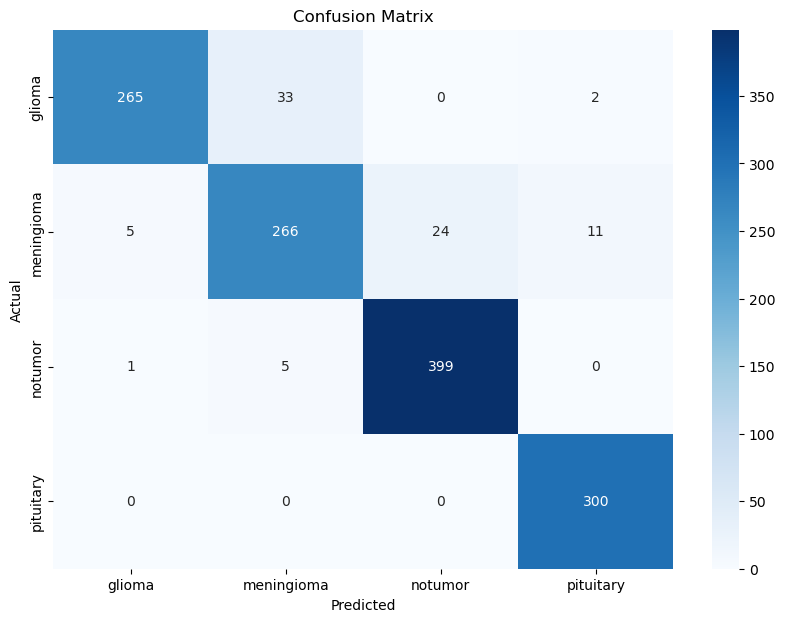

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns

conf_matrix = confusion_matrix(all_labels, all_predictions)
print('Confusion Matrix:')
print(conf_matrix)


class_report = classification_report(all_labels, all_predictions, target_names=test_dataset.classes)
print('Classification Report:')
print(class_report)




plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=test_dataset.classes, yticklabels=test_dataset.classes)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

Gathering probabilities from Test Set...


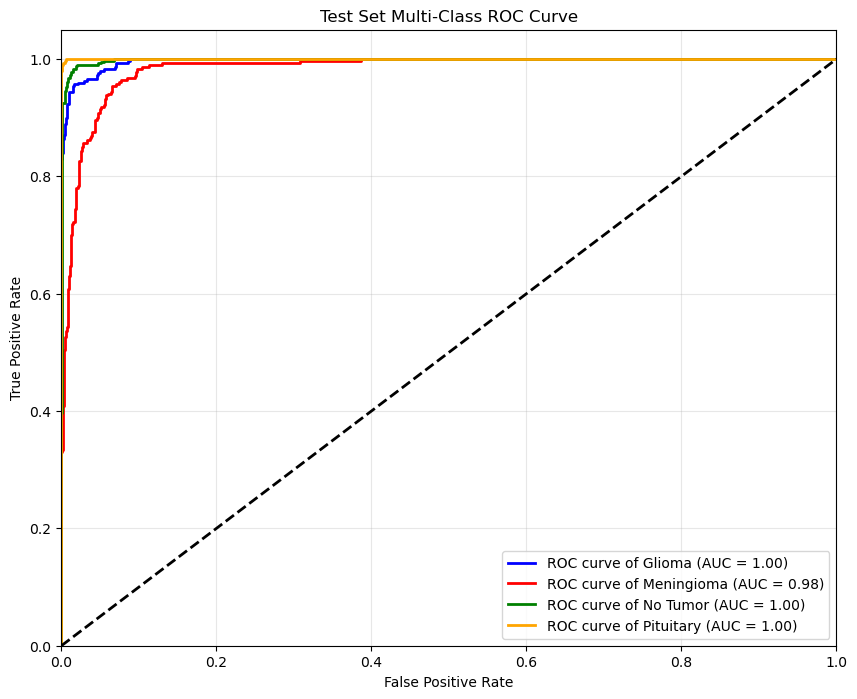

In [65]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
import torch
import torch.nn.functional as F


class_names = ['Glioma', 'Meningioma', 'No Tumor', 'Pituitary']
n_classes = len(class_names)


model.eval()
y_true = []
y_scores = []

print("Gathering probabilities from Test Set...")
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        
       
        probs = F.softmax(outputs, dim=1)
        
        y_true.extend(labels.cpu().numpy())
        y_scores.extend(probs.cpu().numpy())

y_true = np.array(y_true)
y_scores = np.array(y_scores)


y_true_bin = label_binarize(y_true, classes=[0, 1, 2, 3])


fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# 5. Plotting
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green', 'orange']

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2) # Random Guessing Line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Test Set Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

# Efficientnet B0 model


In [27]:
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision.models import efficientnet_b0
device = torch.device("cuda:0")
model = efficientnet_b0(pretrained=True)

model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 4)
model.to(device)

D:\software\Anaconda\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
D:\software\Anaconda\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [37]:
eta = 0.001
loss_F = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr = eta)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)
epoch_train_loss= []
epoch_val_loss =[]
train_accs =[]
val_accs = []

D:\software\Anaconda\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [39]:
number_epochs = 20
highest_val_accuracy = 0.0
for epoch in range(number_epochs):
    model.train()
    train_loss = 0.0
    correct = 0
    total = 0
    for batch_idx, (images, labels) in enumerate(train_loader):
        images = images.to(device)
        labels = labels.to(device)
        optimizer.zero_grad() ## to delete any cache
        outputs = model(images)
        ## now we have 16 values in the prediction and 16 values in the label, we need to merge them together
        loss = loss_F(outputs, labels)
        loss.backward() ## this computes back propagation to update the gradients
        ##the next step is to update the parameters of the model according to those gradients 
        optimizer.step()
        train_loss += loss.item()## now loss is a tensor, we need to store the value of the tensor in the losses list, .item() grabs the value of tensors
        predicted = torch.max(outputs, 1)[1]##tensor([
                                                       ##[2.3, 1.5, 0.2, 3.1],   # Scores for Sample 1
                                                       ##[0.5, 2.2, 3.3, 0.8],   # Scores for Sample 2
                                                       ##[1.1, 0.9, 2.5, 4.0]    # Scores for Sample 3])
        total = total + labels.size(0)
        correct += (predicted == labels).sum().item()
    train_accuracy = correct/total
    train_loss /=len(train_loader)
    epoch_train_loss.append(train_loss)
    train_accs.append(train_accuracy)
    
    ##validate for current epoch
    
    model.eval()
    val_loss = 0.0
    correct = 0
    total= 0
    true_labels = []
    predicted_labels = []
    with torch.no_grad(): ## just to save computational power, no need for calculating gradients
        for D, (images, labels) in enumerate(val_loader):
            images = images.to(device)
            labels = labels.to(device)
            output = model(images) 
            loss = loss_F(output, labels)
            val_loss += loss.item()
            predicted = torch.max(output, 1)[1]
            true_labels.extend(labels.cpu().numpy())
            predicted_labels.extend(predicted.cpu().numpy())
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    val_loss = val_loss / len(val_loader)
    epoch_val_loss.append(val_loss)
    val_accuracy = correct / total
    val_accs.append(val_accuracy)
    true_labels = np.array(true_labels)
    predicted_labels = np.array(predicted_labels)
    
    print(f'Epoch [{epoch+1}/{number_epochs}], '
          f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accs[-1]:.2%}, '
          f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accs[-1]:.2%}')
    scheduler.step(val_loss)
    if val_accuracy > highest_val_accuracy:
        highest_val_accuracy = val_accuracy  # Update the highest validation accuracy
        torch.save(model.state_dict(), 'efficient_best.pth')


Epoch [1/20], Training Loss: 0.2887, Training Accuracy: 89.62%, Validation Loss: 0.1576, Validation Accuracy: 94.67%
Epoch [2/20], Training Loss: 0.1326, Training Accuracy: 95.61%, Validation Loss: 0.0606, Validation Accuracy: 97.81%
Epoch [3/20], Training Loss: 0.1026, Training Accuracy: 96.74%, Validation Loss: 0.0938, Validation Accuracy: 97.34%
Epoch [4/20], Training Loss: 0.0864, Training Accuracy: 97.27%, Validation Loss: 0.0565, Validation Accuracy: 97.81%
Epoch [5/20], Training Loss: 0.0485, Training Accuracy: 98.59%, Validation Loss: 0.0513, Validation Accuracy: 97.96%
Epoch [6/20], Training Loss: 0.0571, Training Accuracy: 98.12%, Validation Loss: 0.0415, Validation Accuracy: 99.06%
Epoch [7/20], Training Loss: 0.0549, Training Accuracy: 98.33%, Validation Loss: 0.0491, Validation Accuracy: 98.43%
Epoch [8/20], Training Loss: 0.0390, Training Accuracy: 98.75%, Validation Loss: 0.0360, Validation Accuracy: 98.59%
Epoch [9/20], Training Loss: 0.0480, Training Accuracy: 98.36%, 

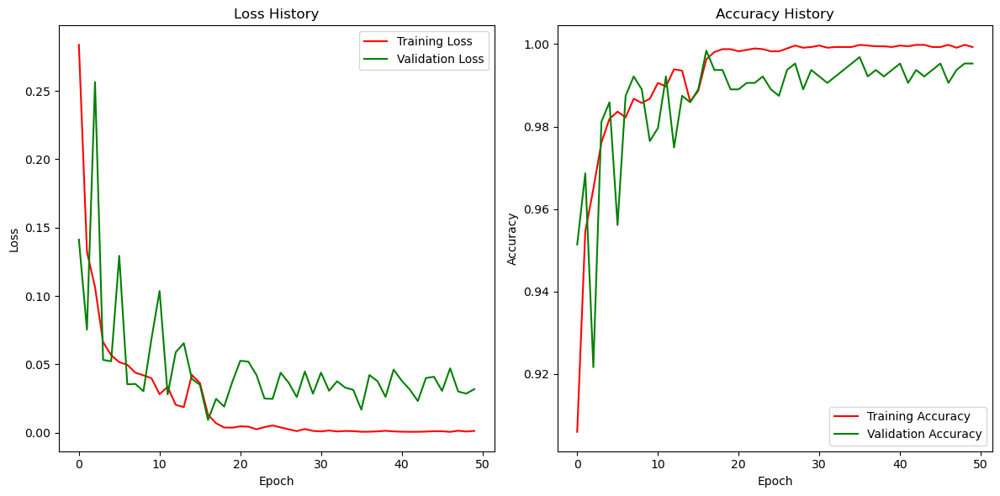

In [101]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(epoch_train_loss, c='r' ,label='Training Loss')
plt.plot(epoch_val_loss, c='g', label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss History')

plt.subplot(1, 2, 2)
plt.plot(train_accs, c='r', label='Training Accuracy')
plt.plot(val_accs, c='g', label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy History')

plt.tight_layout()
plt.show()
        

In [29]:
model.load_state_dict(torch.load('efficient_best.pth'))  # Load your trained model weights
model.to('cuda:0')  # Move to device


C:\Users\20112\AppData\Local\Temp\ipykernel_33884\1452280018.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('efficient_best.pth'))  # L

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [28]:
all_predictions = []
all_labels = []

with torch.no_grad():  
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1) 
        all_predictions.extend(predicted.cpu().numpy()) 
        all_labels.extend(labels.numpy())  

In [44]:
all_predictions = np.array(all_predictions)
all_labels = np.array(all_labels)

# Step 4: Calculate accuracy
test_accuracy = accuracy_score(all_labels, all_predictions)
print(f'Test Accuracy: {test_accuracy:.2%}')

Test Accuracy: 99.08%


Confusion Matrix:
[[299   1   0   0]
 [  0 303   3   0]
 [  0   0 405   0]
 [  0   1   0 299]]
Classification Report:
              precision    recall  f1-score   support

      glioma       1.00      1.00      1.00       300
  meningioma       0.99      0.99      0.99       306
     notumor       0.99      1.00      1.00       405
   pituitary       1.00      1.00      1.00       300

    accuracy                           1.00      1311
   macro avg       1.00      1.00      1.00      1311
weighted avg       1.00      1.00      1.00      1311



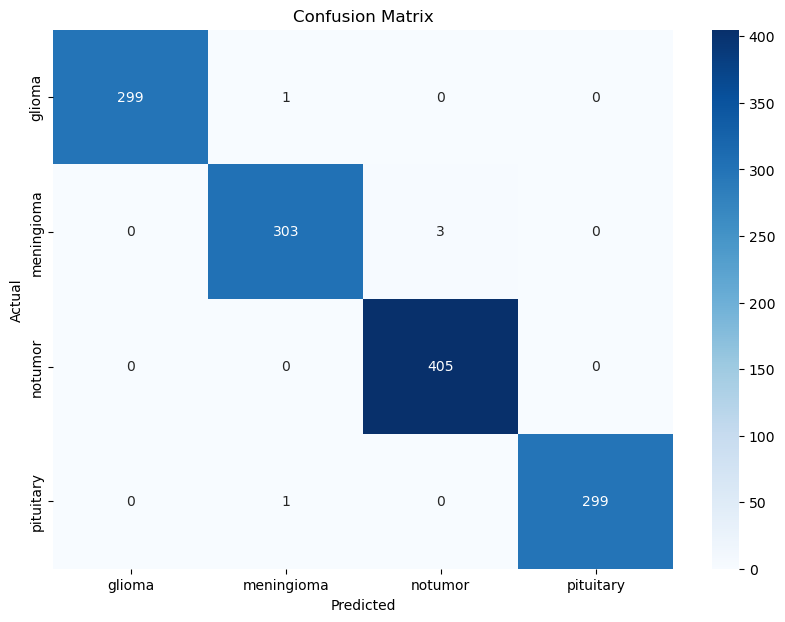

In [109]:
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

conf_matrix = confusion_matrix(all_labels, all_predictions)
print('Confusion Matrix:')
print(conf_matrix)

# Step 6: Generate classification report
class_report = classification_report(all_labels, all_predictions, target_names=test_dataset.classes)
print('Classification Report:')
print(class_report)

# Optionally, you can visualize the confusion matrix using matplotlib


plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=test_dataset.classes, yticklabels=test_dataset.classes)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

Gathering probabilities from Test Set...


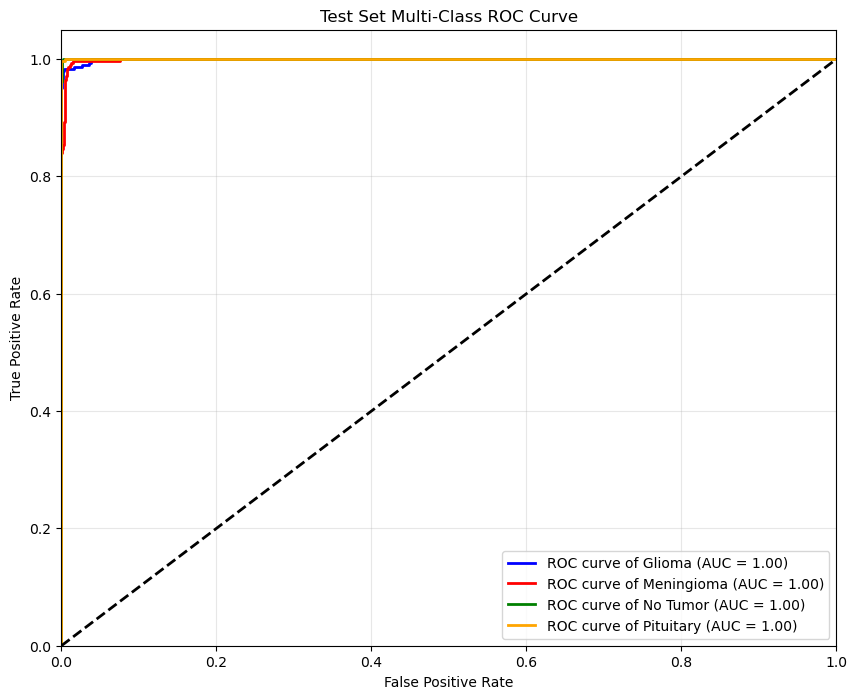

In [47]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
import torch
import torch.nn.functional as F


class_names = ['Glioma', 'Meningioma', 'No Tumor', 'Pituitary']
n_classes = len(class_names)


model.eval()
y_true = []
y_scores = []

print("Gathering probabilities from Test Set...")
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        
       
        probs = F.softmax(outputs, dim=1)
        
        y_true.extend(labels.cpu().numpy())
        y_scores.extend(probs.cpu().numpy())

y_true = np.array(y_true)
y_scores = np.array(y_scores)


y_true_bin = label_binarize(y_true, classes=[0, 1, 2, 3])


fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# 5. Plotting
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green', 'orange']

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2) # Random Guessing Line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Test Set Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

In [41]:
import tkinter as tk
from tkinter import filedialog
from PIL import Image, ImageTk
import os

def get_prediction(image_path):
    predicted_label_custom = predict_image_label(image_path, model)
    
    mapping = {0: 'Glioma', 1: 'Meningioma', 2: 'No tumor', 3: 'Pituitary'}
    return mapping.get(predicted_label_custom, "Unknown")


def upload_image():
    # 1. Open File Explorer
    file_path = filedialog.askopenfilename(
        filetypes=[("Image files", "*.jpg *.jpeg *.png *.bmp")]
    )
    
    if file_path:
        # 2. Display the image in the GUI
        img = Image.open(file_path)
        img = img.resize((300, 300)) # Resize to fit the window
        img_tk = ImageTk.PhotoImage(img)
        
        image_label.config(image=img_tk)
        image_label.image = img_tk # Keep a reference
        
        # 3. Run Prediction
        result = get_prediction(file_path)
        
        # 4. Update Result Label
        result_label.config(text=f"Prediction: {result}", fg="#2ecc71" if result != "No tumor" else "#e74c3c")
        path_label.config(text=f"File: {os.path.basename(file_path)}")

# Initialize Window
root = tk.Tk()
root.title("Brain Tumor Classification AI")
root.geometry("500x600")
root.configure(bg="#f0f0f0")


title_label = tk.Label(root, text="Tumor Detection System", font=("Arial", 20, "bold"), bg="#f0f0f0")
title_label.pack(pady=20)

# Button to Upload
upload_btn = tk.Button(root, text="Select MRI Image", command=upload_image, 
                       font=("Arial", 12), bg="#3498db", fg="white", padx=20, pady=10)
upload_btn.pack(pady=10)


image_label = tk.Label(root, bg="#f0f0f0")
image_label.pack(pady=10)
path_label = tk.Label(root, text="No image selected", font=("Arial", 10), bg="#f0f0f0", fg="gray")
path_label.pack()
result_label = tk.Label(root, text="", font=("Arial", 16, "bold"), bg="#f0f0f0")
result_label.pack(pady=20)

root.mainloop()